# General Information

- The code was run locally with `Python 3.9.19` inside `Visual Studio Code` editor.
- It took around `15 seconds` to produce the final plot.
- To run the code without any errors, one must download the following libraries: `pandas==2.2.1` and `matplotlib==3.8.3`
- **Data** used in the plots is the excel files extracted from `ClusterBicluster.zip` archive that was downloaded from the following link (Moodle): https://moodle.uni.lu/mod/folder/view.php?id=351275
- Note that it is important to normalize each column, since the ranges of the variabls vary greatly.
- All the code is well-documented and explained using comments (see `#` for a comment)

# Steps to reproduce the final plot

## On your local machine (assuming you have Windows platform)

1) Dowload the data archive from https://moodle.uni.lu/mod/folder/view.php?id=351275
2) Move the archive where you store this `sheet3_exercise1.ipynb` notebook (e.g. under `sheet3` directory)
3) Unarchive the archived data (make sure that `.csv` files are now inside `Cluster_Bicluster` folder)
4) We assume you have Python installed. We used `Python 3.9.19` to run all the code.
5) Install necessary libraries using pip: `pip install pandas==2.2.1 matplotlib==3.8.3`.
6) Run each cell under `Code` section. The last cell will run `plot_runs` function, which will generate the final plot and save it under `sheet3_exercise1_plot.png` name.

## On HPC

To run this notebook on HPC you will first need to setup Jupyter on HPC by following these steps:

1. Log into your HPC instance by using the command: `ssh -p 8022 <your-login>@access-iris.uni.lu` (replace your-login with your HPC login)
2. Once logged in, initialize a session using `si`
3. Make sure you are in `home` directory
4. Create a directory inside HPC: `mkdir sheet3`
5. Go to the directory: `cd sheet3`
6. Load python: `module load lang/Python`
7. Create a Python environment for this activity: `python -m venv jupyter_env`
8. Activate the environment: `source jupyter_env/bin/activate`
9.  Install/Upgrade pip: `python -m pip install --upgrade pip`
10. Install Jupyter: `python -m pip install jupyter ipykernel`
11. Install all the required dependencies: `pip install pandas==2.2.1 matplotlib==3.8.3`
12. Register our environment to the Jupyter kernel: `python -m ipykernel install --sys-prefix --name jupyter_env`
13. Run the following command to launch a jupyter server on HPC: `jupyter notebook --no-browser --port=8888 --NotebookApp.token='' --NotebookApp.password='' -NotebookApp.disable_check_xsrf=True --ip=0.0.0.0`

Now go on your local machine, open a new terminal tab and do the following:
1. Dowload the data archive from https://moodle.uni.lu/mod/folder/view.php?id=351275
2. Move the archive where you store this `sheet3_exercise1.ipynb` notebook (e.g. under `sheet3` directory)
3. Copy files from local to HPC: on your local machine within the directory where you have the `sheet3_exercise1.ipynb` and `ClusterBicluster.zip` files stored run the following commands:\
`scp -P 8022 sheet3_exercise1.ipynb <your-login>@access-iris.uni.lu:~/sheet3`\
`scp -P 8022 ClusterBicluster.zip <your-login>@access-iris.uni.lu:~/sheet3`
4. On HPC, unarchive the data archive: `unzip ClusterBicluster.zip` (make sure it was unarchived to `sheet3` directory).
5. Now, inside `sheet3` directory you should have: `sheet3_exercise1.ipynb`, `ClusterBicluster.zip` and `ClusterBicluster` folder containing all the `.csv` files.
6. Launch the jupyter notebook on localhost by running: `ssh -p 8022 -NL 8888:iris-XXX:8888 <your-login>@access-iris.uni.lu` and replace XXX by the number of the iris cluster provided to you on HPC. For example, I have on HPC *(jupyter_env) 0 [azaitsev@iris-014 sheet3](3487277 1N/T/1CN)$* so I would replace XXX by *014*
7. On your machine open a browser and go to `localhost:8888` or `http://127.0.0.1:8888/` this should open your Jupyter interface
8. Click on **sheet3_exercise1.ipynb** then click on **Run All*

# Code

In [1]:
# Imports
import pandas as pd # used to read the excel files
import matplotlib.pyplot as plt # used for plotting
import os # used to read files from a directory

In [2]:
def process_run(file_path, ax, title):
    """
    Read and process a CSV file of a run, normalize its data, and plot the normalized data on a given axis.

    Parameters:
        - file_path (str): Path to the CSV file to be processed.
        - ax (matplotlib.axes.Axes): The Matplotlib axis object on which the data will be plotted.
        - title (str): The title for the subplot.
    """
    # read CSV file excluding the "COMUNI" column
    df = pd.read_csv(file_path)
    
    # Find the index of the row where the third column is "Ratio Zero to total"
    ratio_row_index = df[df.iloc[:, 2] == "Ratio Zero to total"].index[0]
    
    # Read CSV file up to the row with "Ratio Zero to total"
    df = pd.read_csv(file_path, nrows=ratio_row_index)
    df_no_comuni = df.drop(columns=["COMUNI"])
    
    # Normalize each column
    for column in df_no_comuni.columns:
        # Handle commas in float values (convert them to dots)
        if df_no_comuni[column].dtype == 'object':
            df_no_comuni[column] = df_no_comuni[column].str.replace(',', '.').astype(float)
        # Handle the case when the column only stores 0's
        if df_no_comuni[column].max() - df_no_comuni[column].min() != 0:
            df_no_comuni[column] = (df_no_comuni[column] - df_no_comuni[column].min()) / (df_no_comuni[column].max() - df_no_comuni[column].min())
    
    # Plotting
    city_names = []  # To store city names
    added_dots = False
    for i, row in df_no_comuni.iterrows():
        # Add only less than 13 cities to the legend, so that we do not overpopulate the legend
        if len(city_names) <= 13:
            ax.plot(row, label=df.loc[i, "COMUNI"])  # Add label for legend
            city_names.append(df.loc[i, "COMUNI"])  # Store city name
        else:
            if added_dots:
                ax.plot(row)
            else:
                ax.plot(row, label="...and many more")  # Add label for legend
                city_names.append("...and many more")  # Store city name
                added_dots = True

    ax.set_title(title)  # Set subplot title
    ax.legend(city_names, title="City", bbox_to_anchor=(1, 1.02), fontsize='large')  # Add legend

In [3]:
def plot_runs(data_path, num_runs):
    """
    Create a series of subplots from multiple CSV files (runs) and visualize the data.

    Parameters:
        - data_path (str): The directory path where the CSV files are stored.
        - num_runs (int): The number of CSV files (runs) to process.
    """
    # Create a figure with 12 rows and 2 columns
    fig, axs = plt.subplots(12, 2, figsize=(36, 64))

    # Process each CSV file
    for i in range(1, num_runs):
        file_name = f"Cluster {i}.csv"
        file_path = data_path + file_name
        
        # Calculate row and column index for subplot
        row_index = (i - 1) // 2
        col_index = (i - 1) % 2
        
        # Process current CSV file and plot in the appropriate subplot
        process_run(file_path, axs[row_index, col_index], title=f"Cluster {i}")
        
        axs[row_index, col_index].set_xticks([])  # Remove x-axis ticks and labels
        axs[row_index, col_index].set_ylim(0, 1)  # Set y-axis limits
        axs[row_index, col_index].set_xlabel('Variable', fontsize=14)
        axs[row_index, col_index].set_ylabel('Variable Value', fontsize=14)

    fig.suptitle('Results of the execution of a parallel task on a cluster for various variables, each plot represents different run', fontsize=20)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.savefig('sheet3_exercise1_plot.png')
    plt.show()  # Display the plots


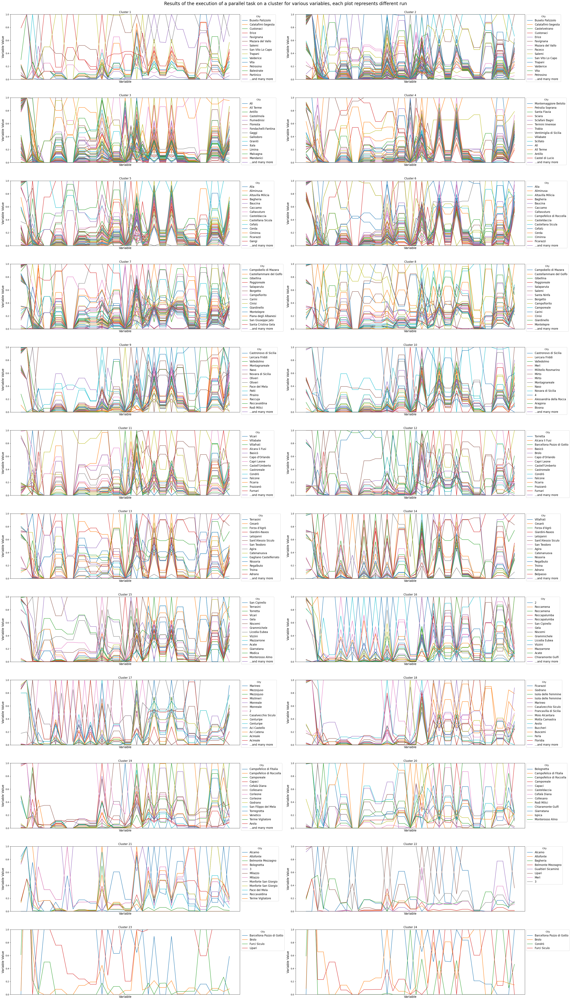

In [5]:
# Define path where the data is stored
data_path = "Cluster_Bicluster/"
# Plot the runs
plot_runs(data_path, len(os.listdir(data_path)))